In [1]:
%load_ext lab_black

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from eda import (
    descriptive_statistics,
    numeric_data_visualizer,
    object_data_visualizer,
    correlation_visualizer,
    descriptive_statistics,
)
from preprocessing import numeric_object_split

In [3]:
ames_train = pd.read_csv(
    "../datasets/train.csv",
    dtype={"MS SubClass": object, "Yr Sold": object, "Mo Sold": object},
)
target = "SalePrice"
ames_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2051 entries, 0 to 2050
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Id               2051 non-null   int64  
 1   PID              2051 non-null   int64  
 2   MS SubClass      2051 non-null   object 
 3   MS Zoning        2051 non-null   object 
 4   Lot Frontage     1721 non-null   float64
 5   Lot Area         2051 non-null   int64  
 6   Street           2051 non-null   object 
 7   Alley            140 non-null    object 
 8   Lot Shape        2051 non-null   object 
 9   Land Contour     2051 non-null   object 
 10  Utilities        2051 non-null   object 
 11  Lot Config       2051 non-null   object 
 12  Land Slope       2051 non-null   object 
 13  Neighborhood     2051 non-null   object 
 14  Condition 1      2051 non-null   object 
 15  Condition 2      2051 non-null   object 
 16  Bldg Type        2051 non-null   object 
 17  House Style   

First things first, we load in the full training set for the Ames housing data and ensure that the MS SubClass is properly treated as an object, as well as Yr Sold and Mo Sold as they are almost certainly not ordinal due to market fluctuations. We note that several null values are present, but more imputation will be handled in notebook 2.

# Numerical Data
## Variable Distributions
The first variables that need to be analyzed are the numerical features, or more specifically all features which are likely to be ordinal in nature. To do this, the dataframe is split into numerical and object subsets as different visuals need to be used for each. For numerical features

In [4]:
target_values = ames_train[target]
numerics, objects = numeric_object_split(ames_train)

/home/awalsh/ga/projects/project_2/notebooks/eda.py:173: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 3)


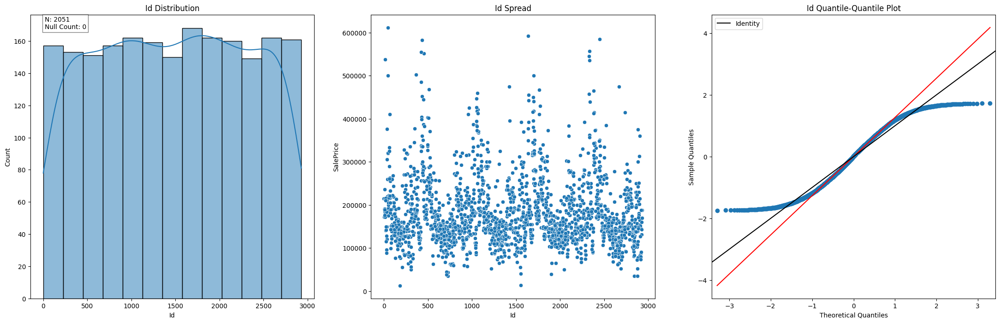

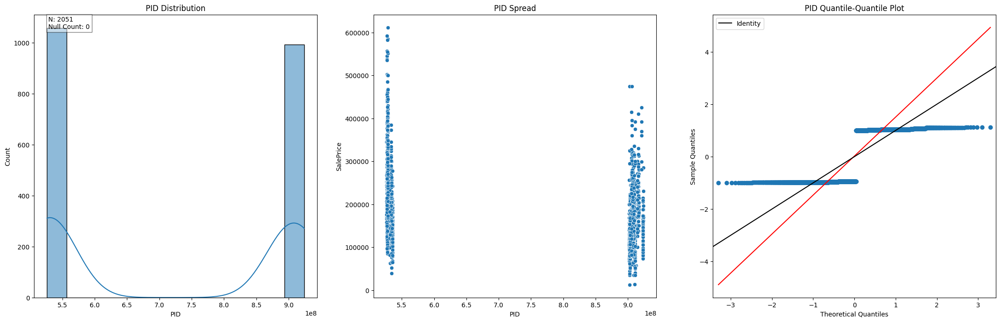

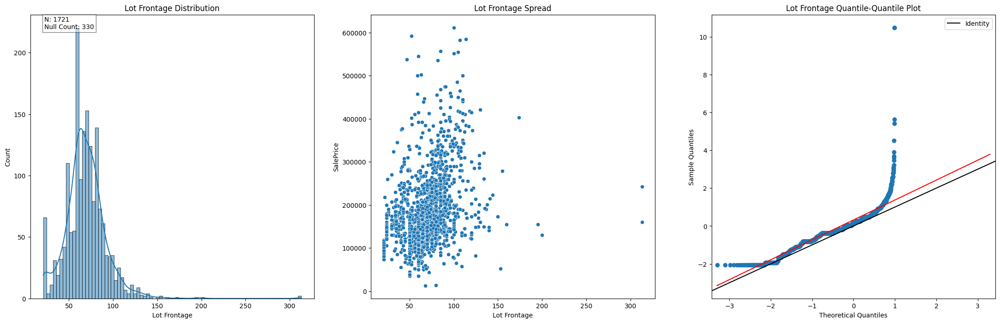

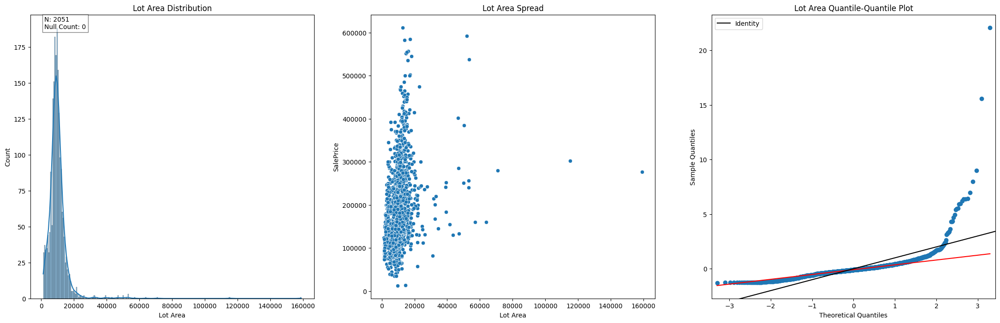

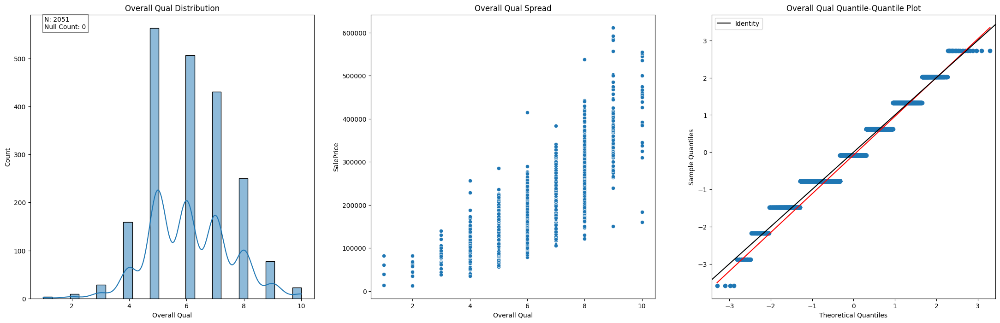

...

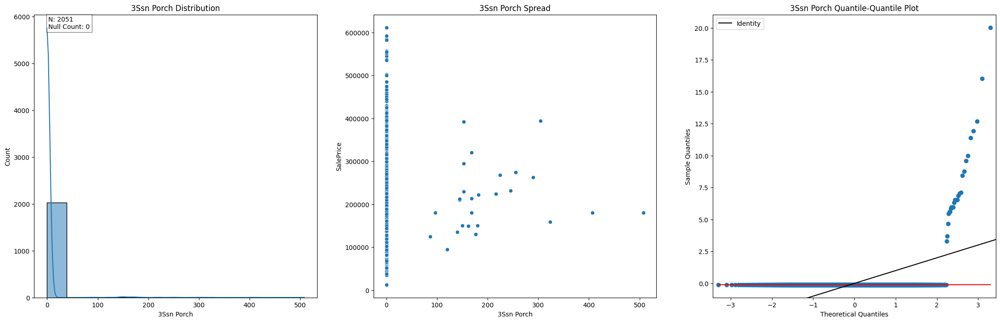

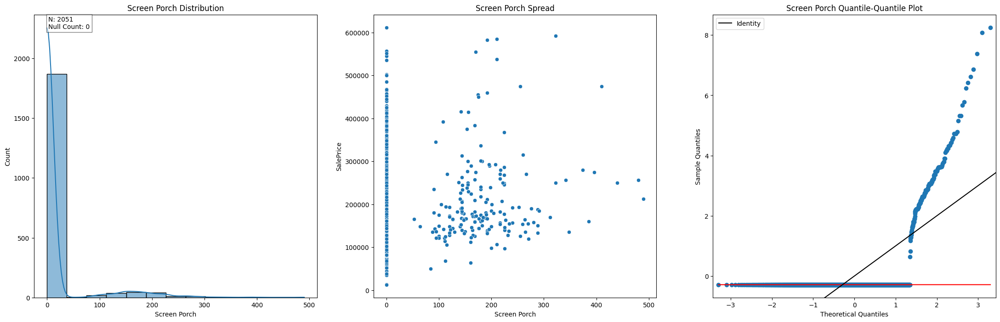

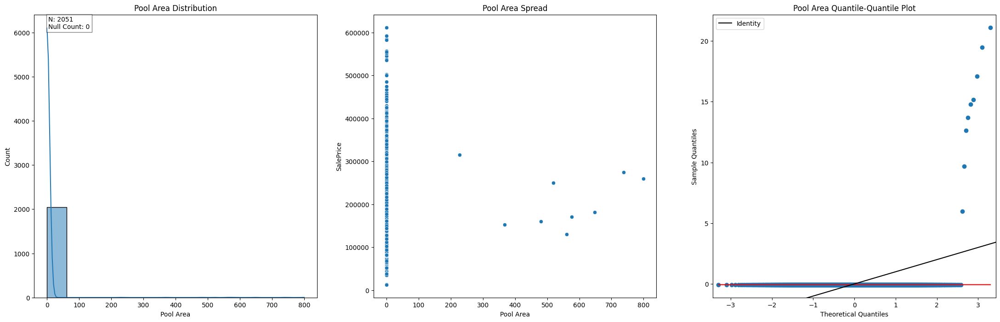

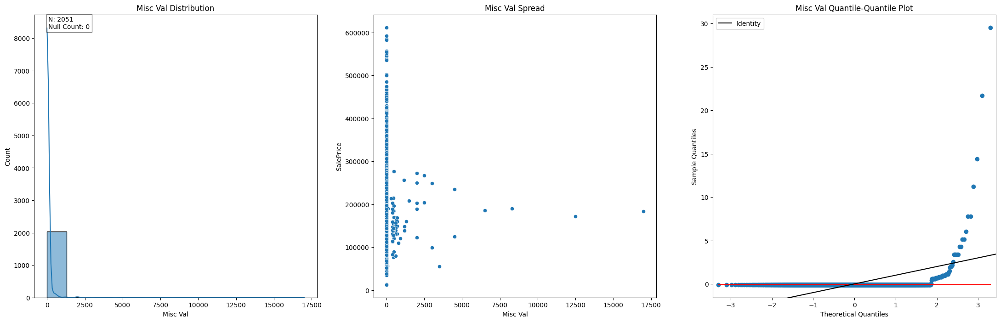

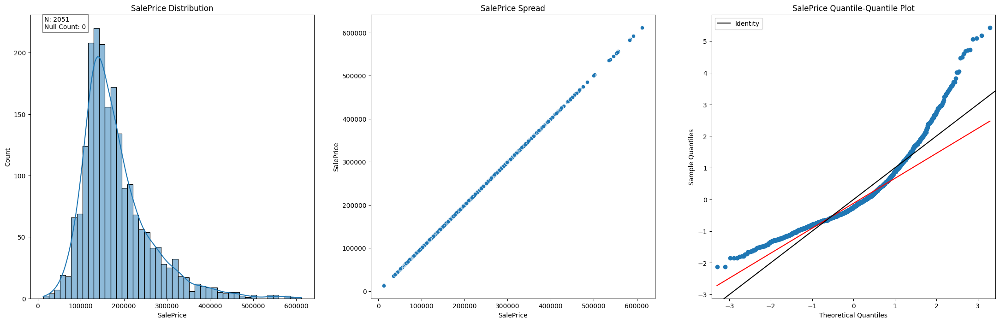

In [5]:
numeric_data_visualizer(numerics, target_values, path="../img/eda", show=True)

The first feature on the list is Id, a unique identifier for each home sale. Its values are nearly uniformly distributed in the dataset, but when plotted against SalsePrice there appears to be some sort of seasonality: large spikes in the sale price of a handful of homes, followed by a drop in price. This may be an indicator of seasonal trends, therefore we investigate further.

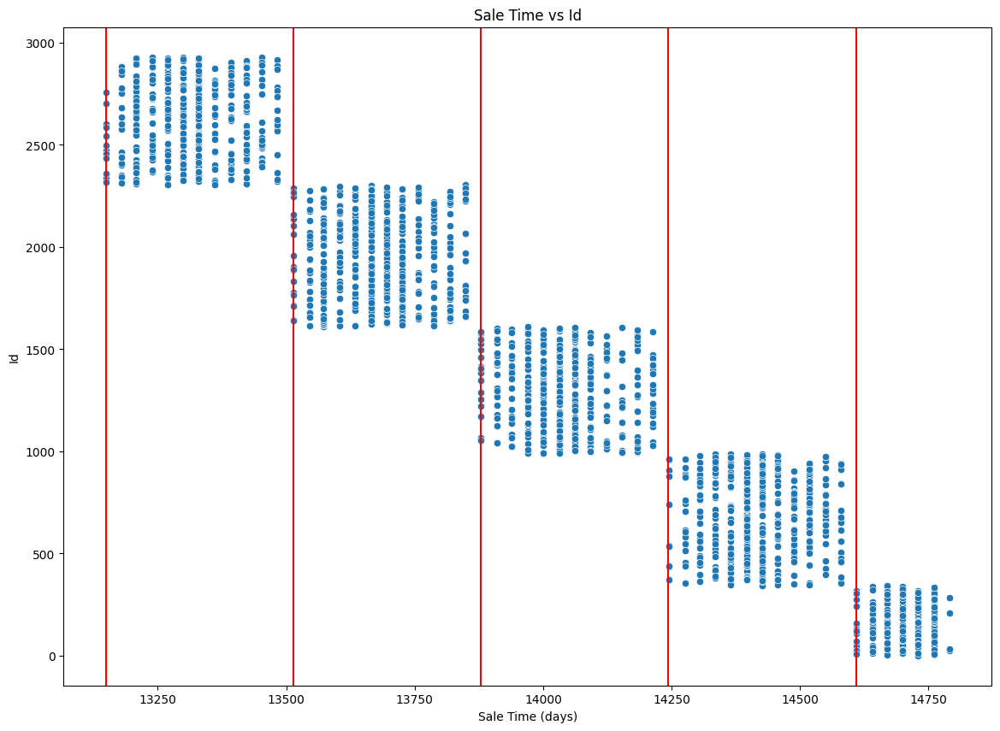

In [6]:
sale_timestamp = pd.to_datetime(objects["Yr Sold"] + "-" + objects["Mo Sold"]).view(
    int
) / (1e9 * 60 * 60 * 24)

fig, ax = plt.subplots(figsize=(14, 10))
sns.scatterplot(x=sale_timestamp, y=numerics["Id"], ax=ax)
plt.xlabel("Sale Time (days)")
plt.ylabel("Id")
plt.title("Sale Time vs Id")
for n in range(5):
    ax.axvline(np.min(sale_timestamp) + n * 365, color="red")

This is an odd distribution, to say the least. First, the Id *decreases* over time, which is strange in of itself, but it doesn't even do so uniformly. Second, the maximum value of Id seems to decrease by a flat amount periodically. The red vertical lines on the plot are spaced yearly, and it is clear that this is when the boundary which causes the Id cluster to "switch" to a new set of values, but the Id values are not chronological within the year. This yearly trend, mixed with the apparent seasonality in the Id-SalePrice plot may indicate that, for each given year, Id *may* be assigned based on a well predicting feature. The data dictionary provides no insight into this, nor do bivariate spreads of Id against other numerical features. The conclusion to draw here is that Id, when grouped yearly, seems to have predictive value and should be included in the model.

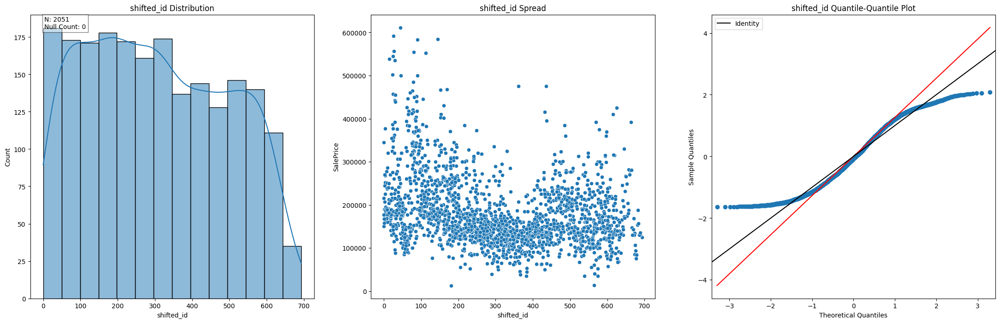

In [7]:
df_temp = ames_train.copy()
df_temp["yearly_min_id"] = ames_train.groupby(by="Yr Sold")["Id"].transform(min)
df_temp["shifted_id"] = df_temp["Id"] - df_temp["yearly_min_id"]

numeric_data_visualizer(
    df_temp, target_values, path="../img/eda", show=True, cols=["shifted_id"]
)

del df_temp

Naively, this *almost* looks like SalePrice could be quadratic in shifted Id. However, whatever the relationship the Id has with the data is not strong. A shifted id feature will be created during preprocessing to let the model decide if it is worth keeping, but this strange Id assignment system does not seem especially promising.

The next feature on the list is the PID, or parcel identification number [(*source*)](https://en.wikipedia.org/wiki/Assessor%27s_parcel_number). PID has two classes of values: those beginning with 5, and those beginning with 9. The "5" class visually seems to have higher variance than the "9" class, or at the very least a larger spread between its extreme values. PID may be a good candidate to split the dataset on to get a better fit, as "5" and "9" homes may have common features among their members.

Next, Lot Frontage and Lot Area, both quantities describing the size of the land lot. These variables have two things in common: outliers, and poor sampling. The outliers can be fixed easily enough with a z filter during preprocessing, but the distribution of these two features has a massive oversampling of low values. This may or may not be a problem during modeling. If the variance of SalePrice values associated with low Lot values is sufficiently low, it may not affect the fit, but having a massive spread of data on the origin would adversely affect performance. 

Overall Qual and Overall Cond seem to be ok at a glance. They're a bit uneven in distribution, but are most heavily sampled in the center. However, these two show off the drastic spread of SalePrice on similar quality houses.

## Is SalePrice a good target?
Consider two houses: one luxurious but small, and the other decrepit but large. Due to the innate value of land and livable space, the "bad" house may very well be worth the same as the "good" house. As such, a model fitted exclusively on these two points would get stuck. Generalizing this, it's possible that different quality levels can "point" to both ends of the price spectrum simultaneously, making the features very hard to learn. This is evident in the massive spread in SalePrice for each level of Overall Quality and Condition. As an alternative, we construct a new target: price per unit area. As the advertised area of a home conventionally does not include the area of a finished basement [(*source*)](https://www.sfgate.com/realestate/article/Is-a-Basement-Included-in-the-Square-Footage-of-a-14971637.php), the area of a basement will not be included if one is present.

Text(0.5, 1.0, 'Price per Area vs Quality')

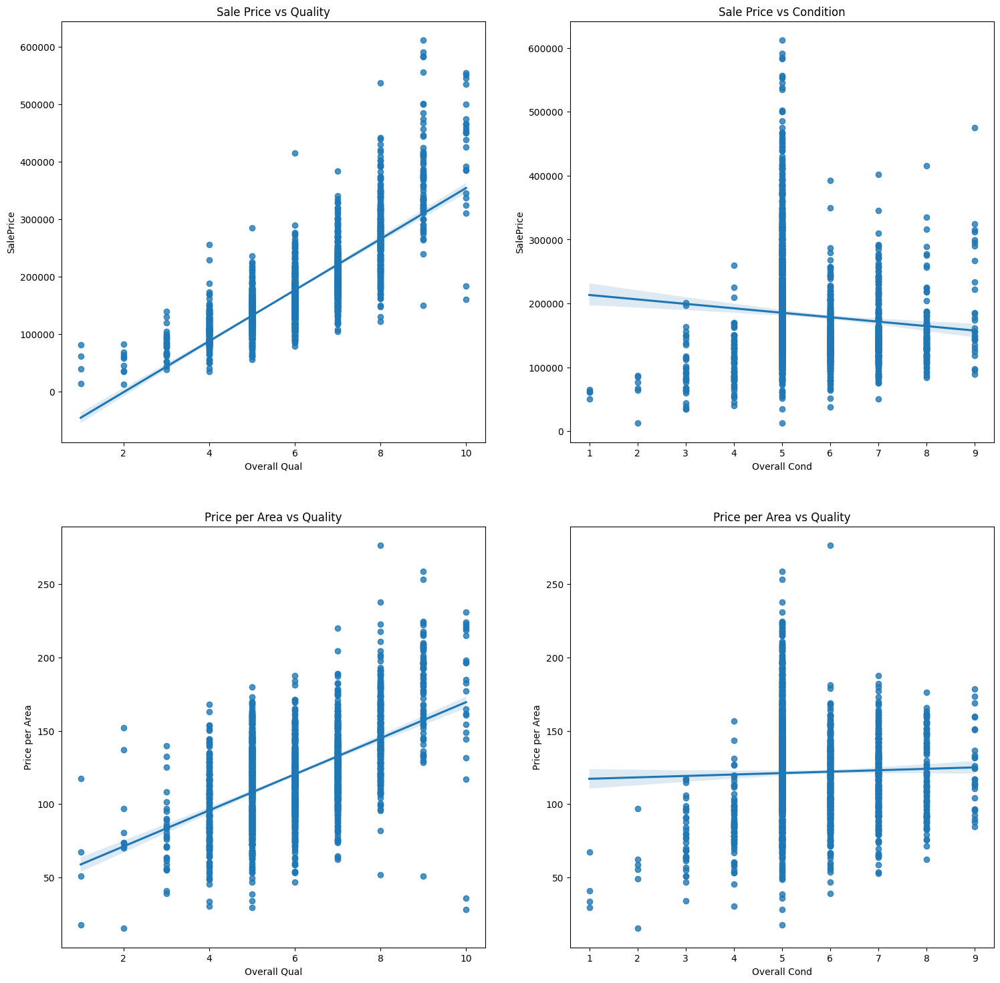

In [8]:
price_per_area = numerics["SalePrice"] / numerics["Gr Liv Area"]

fig, axs = plt.subplots(2, 2)
fig.set_size_inches(18, 18)

sns.regplot(x=numerics["Overall Qual"], y=numerics["SalePrice"], ax=axs[0, 0])
axs[0, 0].set_title("Sale Price vs Quality")
sns.regplot(x=numerics["Overall Cond"], y=numerics["SalePrice"], ax=axs[0, 1])
axs[0, 1].set_title("Sale Price vs Condition")

sns.regplot(x=numerics["Overall Qual"], y=price_per_area, ax=axs[1, 0])
axs[1, 0].set_ylabel("Price per Area")
axs[1, 0].set_title("Price per Area vs Quality")

sns.regplot(x=numerics["Overall Cond"], y=price_per_area, ax=axs[1, 1])
axs[1, 1].set_ylabel("Price per Area")
axs[1, 1].set_title("Price per Area vs Quality")

The effect on quality was minimal, however, in the condition plot, the slope of a simple regression fit went from negative to ever so slightly positive. This idicates that price per area may be a better feature to try to predict. It may also be worth splitting the dataset into "average" and "non-average" houses to deal with the middle-heavy distribution.


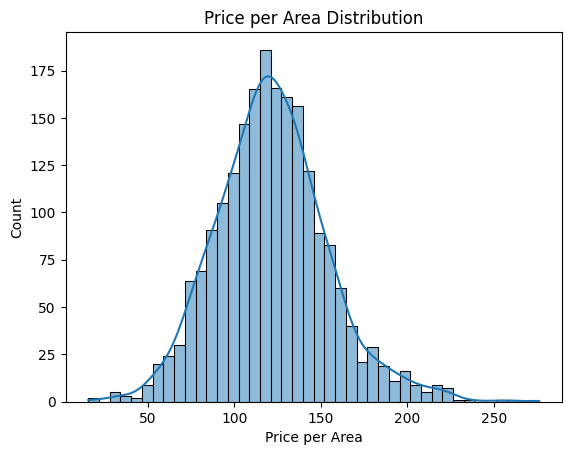

In [16]:
numeric_data_visualizer(
    numerics, price_per_area, path="../img/alternative_eda", show=False
)
sns.histplot(price_per_area, kde=True)
plt.title("Price per Area Distribution")
plt.xlabel("Price per Area")
plt.savefig("../img/eda/price_per_area.png")

## Variable Distributions (continued)

The next two variables are Year Built and Year Remod/Add. The only likely problem with these features are the distribution shape. A Box-Cox transformation will be applied during preprocessing to fix this. Due to the fact that these features are equal in the case that the home has not been remodeled, there is a high degree of colinearlity between them. However, as the goal here is for prediction and not interpretability, this should not adversely affect the model.

Next, Mas Vnr Area. As over half of the samples have an area of zero, this feature should be dropped.

The next four features concern areas of a basement: BsmtFin SF 1 and 2, Bsmt Unf SF, and Total Bsmt SF. These describe how much basement area there is and how it is finished. The lopsidedness of these distributions is easily explained, as an unfinished area will be counted as zero area in the BsmtFin columns. To fix this, we will engineer a new feature as the sum of BsmtFin SF 1 and 2, describing the finished area of the basement. The original two columns will be dropped. Additionally, as Total Bsmt SF is now a combination of finished and unfinished areas, it will be dropped as well.

1st Flr SF and 2nd Flr SF sum to Gr Liv Area. Gr Liv Area has an excellent distribution for fitting, however the first and second floors may be valued differently. Therefore, two versions of the model should be tested: one for Gr Liv Area, and one for 1st and 2nd Flr SF.

The number of bathrooms is likely to be more important than where they are in the house, therefore we instead consider the sum of basement and above grade bathrooms instead.

Text(0.5, 0, 'Total Full Bathrooms')

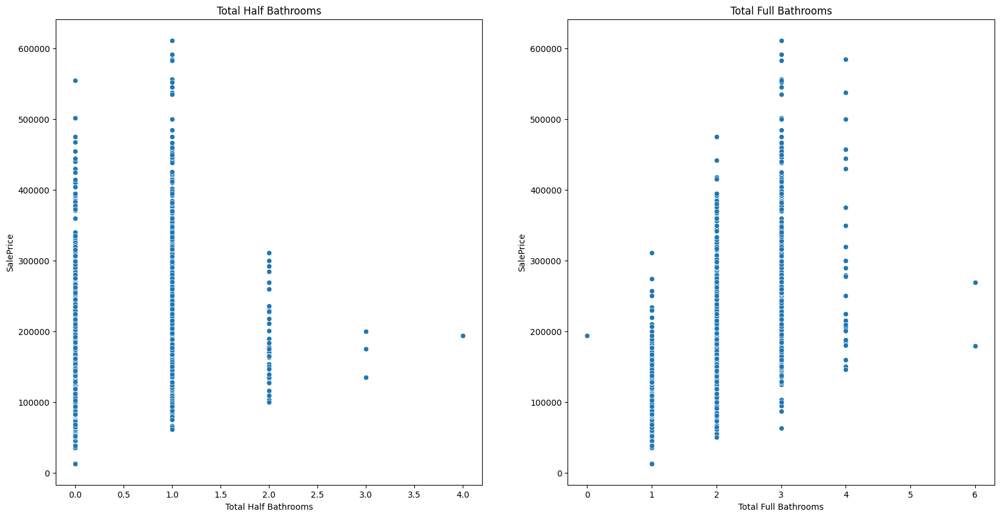

In [10]:
tot_half_baths = numerics["Bsmt Half Bath"] + numerics["Half Bath"]
tot_full_baths = numerics["Bsmt Full Bath"] + numerics["Full Bath"]

fig, axs = plt.subplots(1, 2)
fig.set_size_inches(20, 10)

sns.scatterplot(x=tot_half_baths, y=target_values, ax=axs[0])
axs[0].set_title("Total Half Bathrooms")
axs[0].set_xlabel("Total Half Bathrooms")

sns.scatterplot(x=tot_full_baths, y=target_values, ax=axs[1])
axs[1].set_title("Total Full Bathrooms")
axs[1].set_xlabel("Total Full Bathrooms")

This fit doesn't appear to be better or worse than before, but it preserves data while eliminating features with low variance. Therefore, these features will be constructed during preprocessing.

The next three features are Bedroom, Kitchen, and TotRms AbvGrd. As TotRms includes all types of rooms except bathrooms, it has colinearity with the bedroom and kitchen features. As such, a new feature describing "other" rooms above grade will be constructed, and TotRms will be dropped.

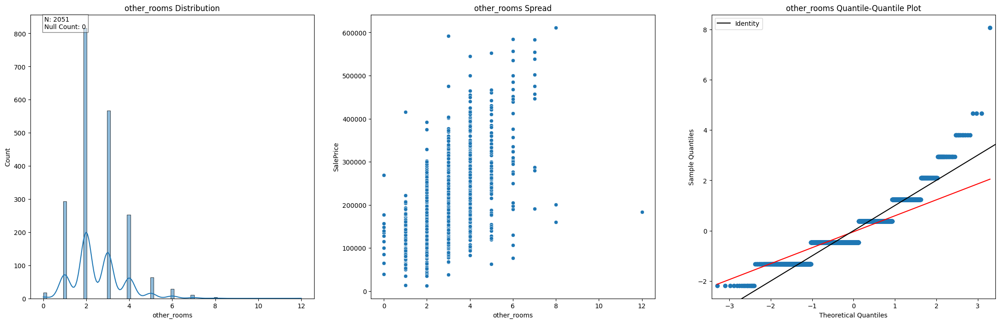

In [11]:
df_temp = numerics.copy()

df_temp["other_rooms"] = (
    df_temp["TotRms AbvGrd"] - df_temp["Bedroom AbvGr"] - df_temp["Kitchen AbvGr"]
)

numeric_data_visualizer(
    df_temp,
    target_values,
    path="../img/eda",
    show=True,
    cols=["other_rooms"],
)

del df_temp

Fireplaces will have a Box-Cox transfromation applied to it, but will otherwise be left as-is.

The garage has three features associated with it: Garage Yr Blt, Garage Cars, and Garage Area. The first is likely to act like Year Built for the home, and excepting the single example from the far future, it likely has some colinearlity with that variable. The second two are also definitely related, as the number of cars a garage can hold is dependent strictly on its area.

<AxesSubplot: xlabel='Garage Area', ylabel='Garage Cars'>

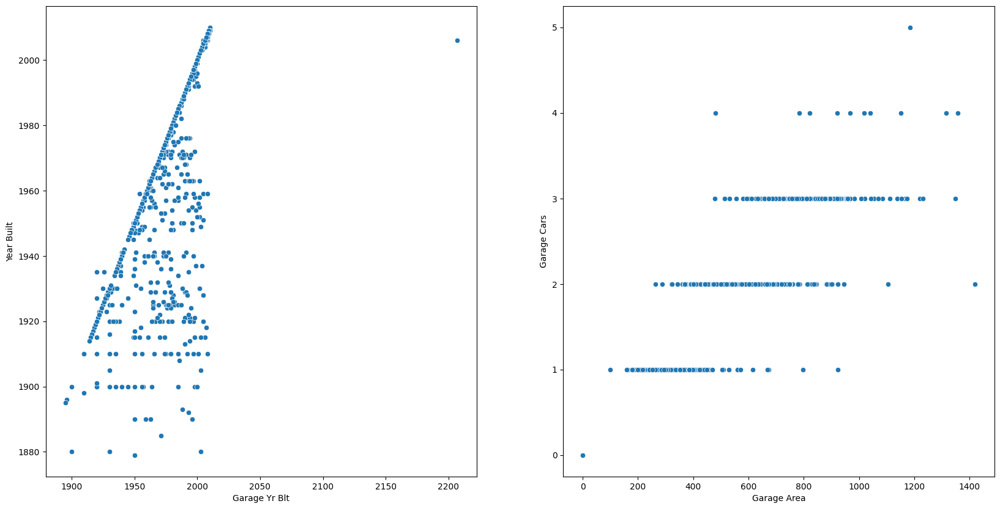

In [12]:
fig, axs = plt.subplots(1, 2)
fig.set_size_inches(20, 10)

sns.scatterplot(x=numerics["Garage Yr Blt"], y=numerics["Year Built"], ax=axs[0])
sns.scatterplot(x=numerics["Garage Area"], y=numerics["Garage Cars"], ax=axs[1])

Indeed, most points on the Garage - Home year built plot fall on the identity line. This may cause problems during fitting, but as it mostly affects interpretability, I plan on leaving this feature in for now. The Area-Cars plot is a bit more surprising, as there are three-car garages that have less area than some one-car garages. There is a much weaker relationship than I imagined, and I think both features need to be included because of it.

The next six features, Wood Deck SF through Pool Area, all describe the area of decks, porches, and pools that the house may have, and they are *all* extremely heavily weighted towards zero. As such, I think the sum of all six features may be less prone to overfitting.

<AxesSubplot: ylabel='SalePrice'>

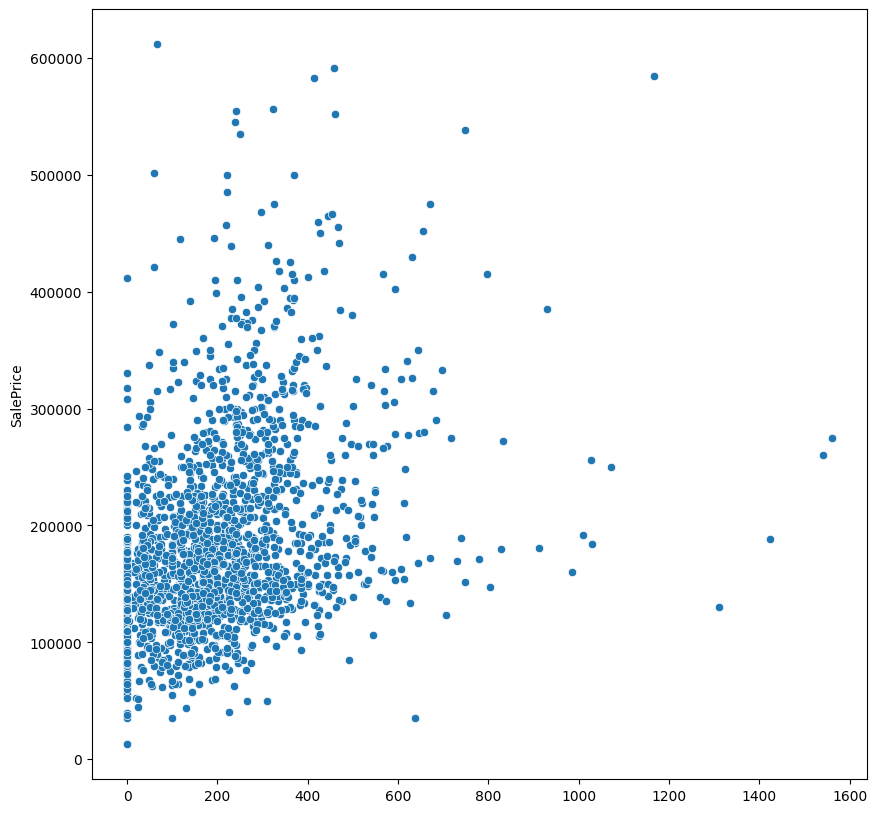

In [13]:
exterior_developed_area = (
    numerics["Wood Deck SF"]
    + numerics["Open Porch SF"]
    + numerics["Enclosed Porch"]
    + numerics["3Ssn Porch"]
    + numerics["Screen Porch"]
    + numerics["Pool Area"]
)

fig, ax = plt.subplots()
fig.set_size_inches(10, 10)

sns.scatterplot(x=exterior_developed_area, y=target_values, ax=ax)

There are fewer points with a value of zero now, but this cluster does not have a clear trend associated with it. Whether this feature is worth including will be dependent on model performance.

And finally, Misc Val. This feature is interesting, as it already has units of dollars. As such, it *probably* should not be allowed to be fitted by a model. If a miscellaneous element is deemed worth \\$5000, and the model decides that the value of a dollar is fundamentally different, then that's a problem. Not to mention the heavy skew this distribution has. I could attempt to include this feature in the model with a fixed coefficient of 1.0, but I think it would be better to simply drop it.

# Categorical Data
For each categorical feature (objects), a barplot of the counts of each unique value will be produced, as well as a box and whisker plot of the distribution of the target variable grouped by each category.

/home/awalsh/ga/projects/project_2/notebooks/eda.py:214: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 2)


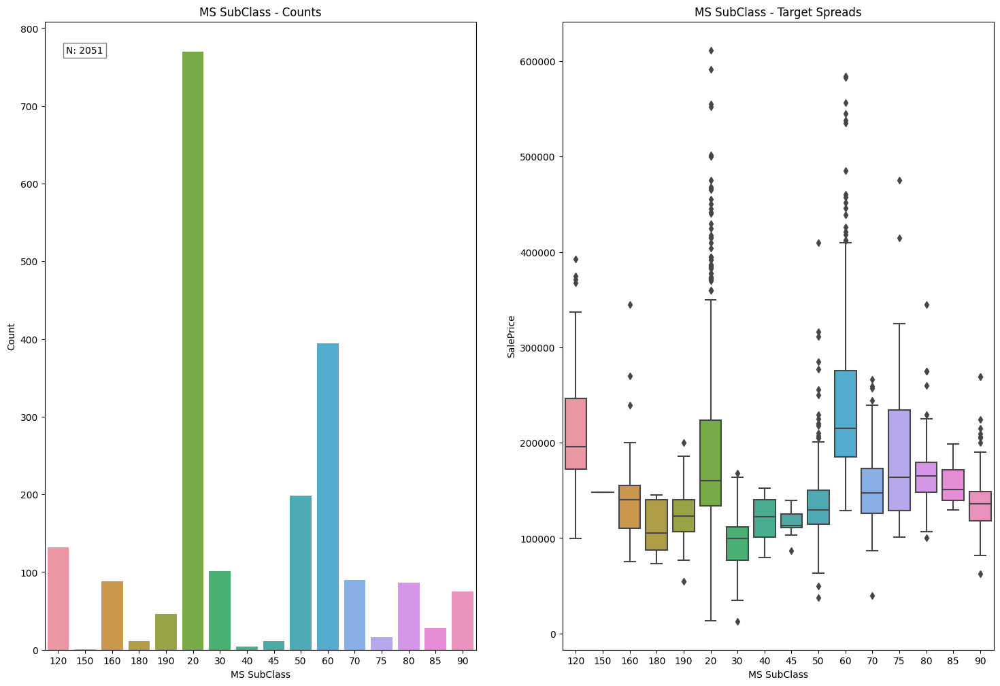

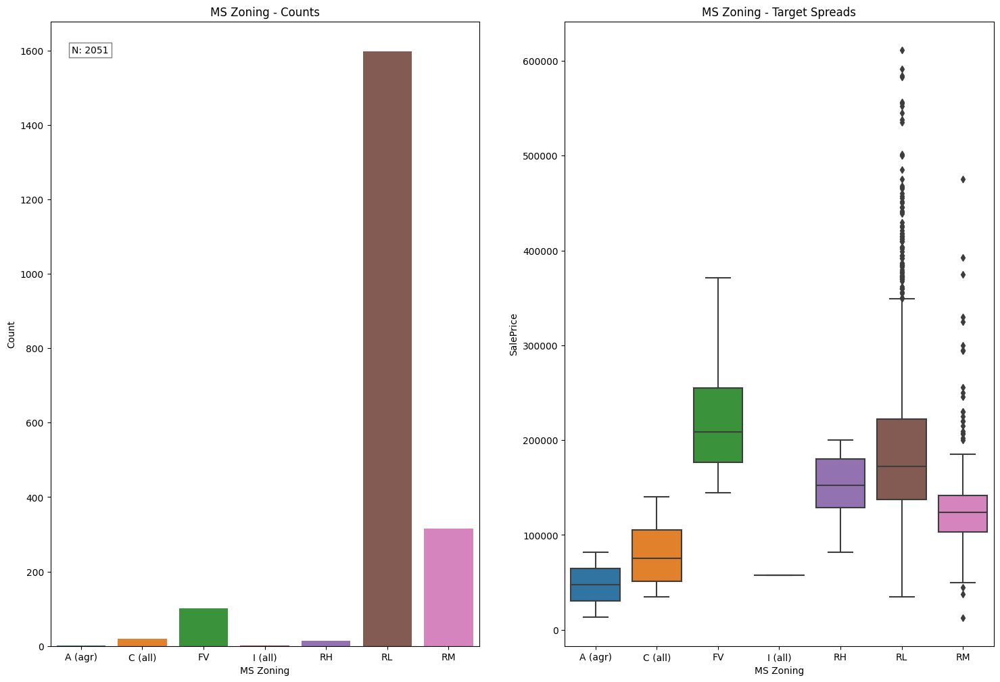

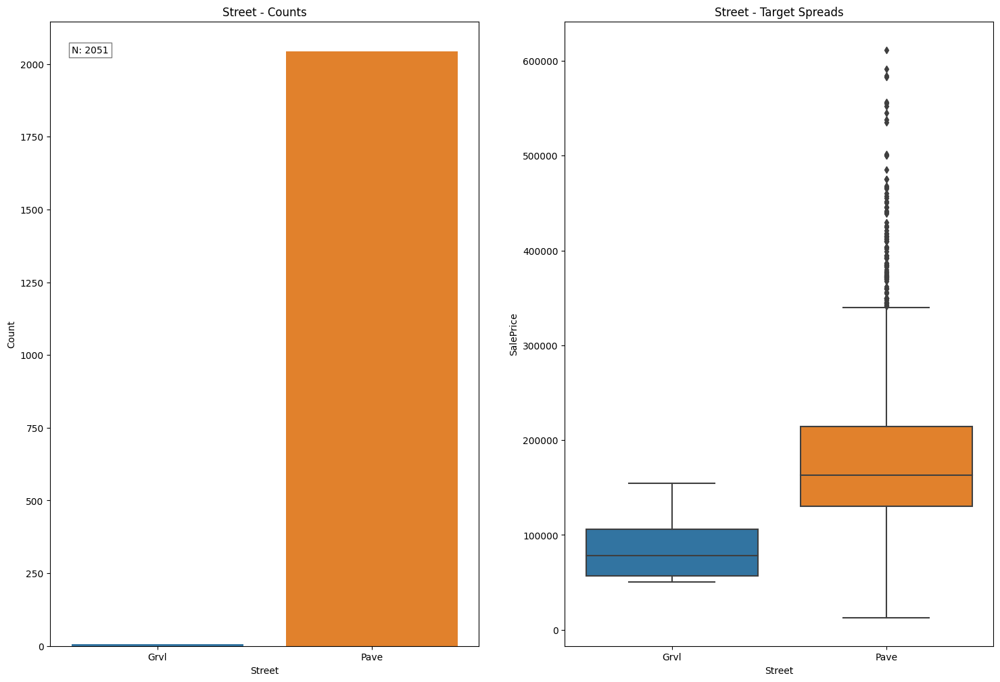

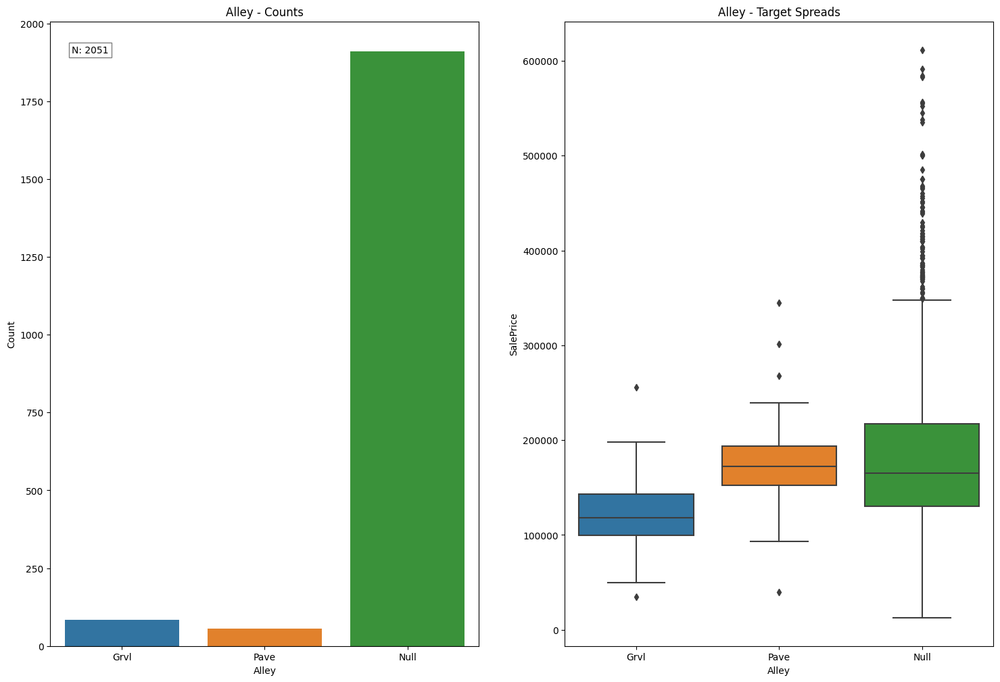

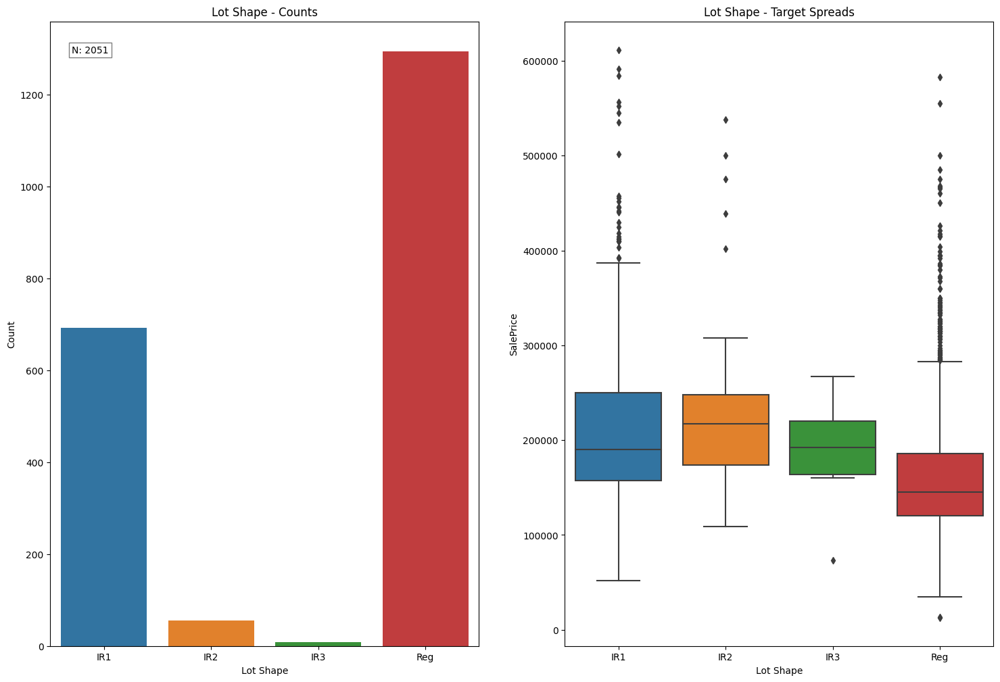

...

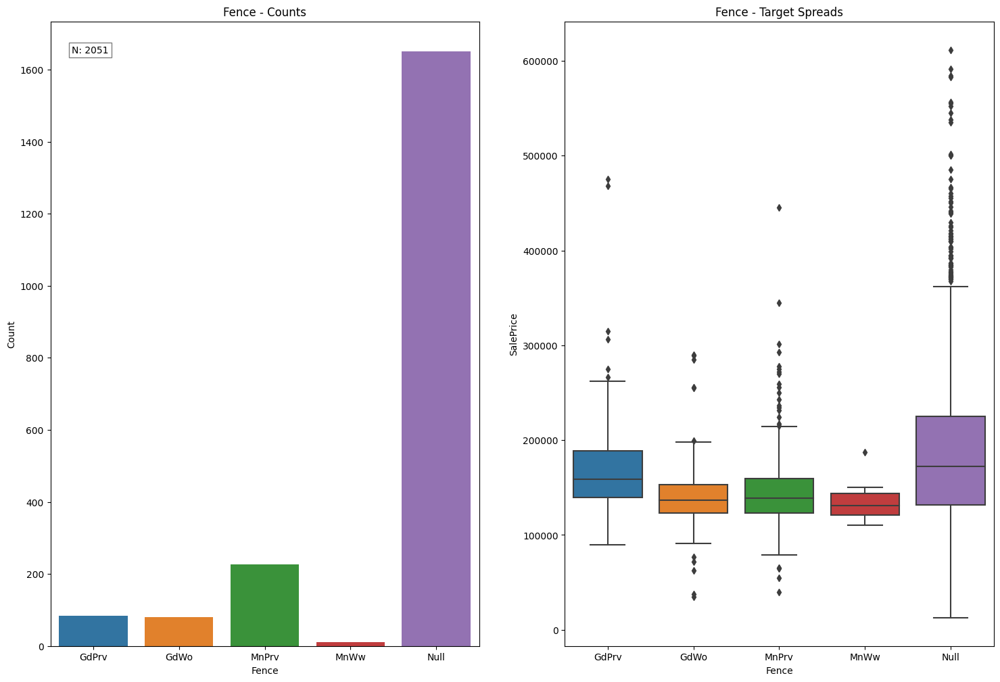

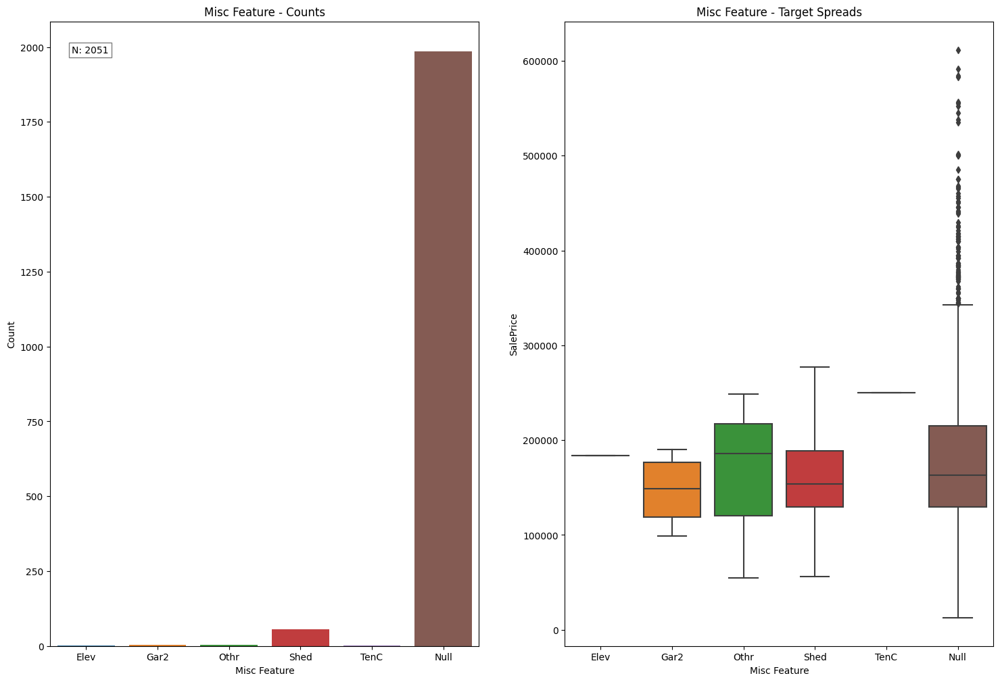

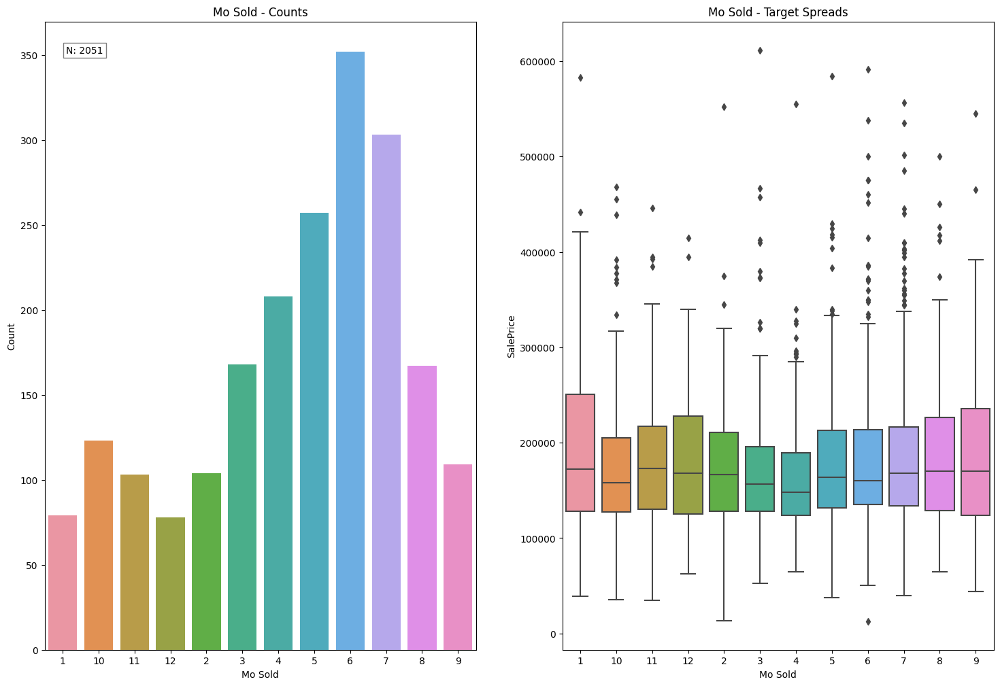

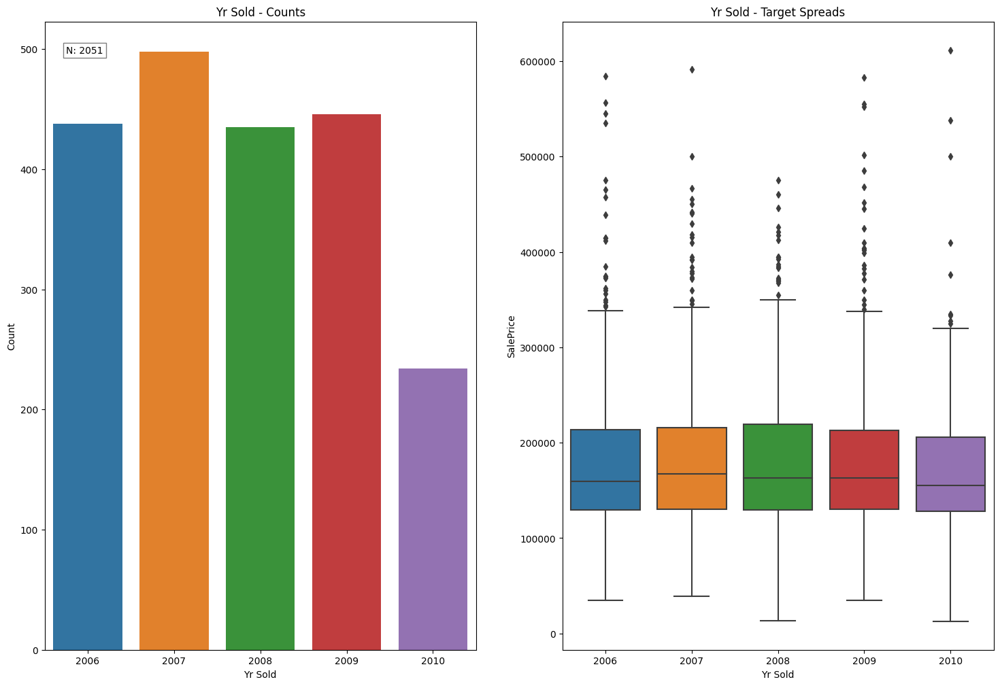

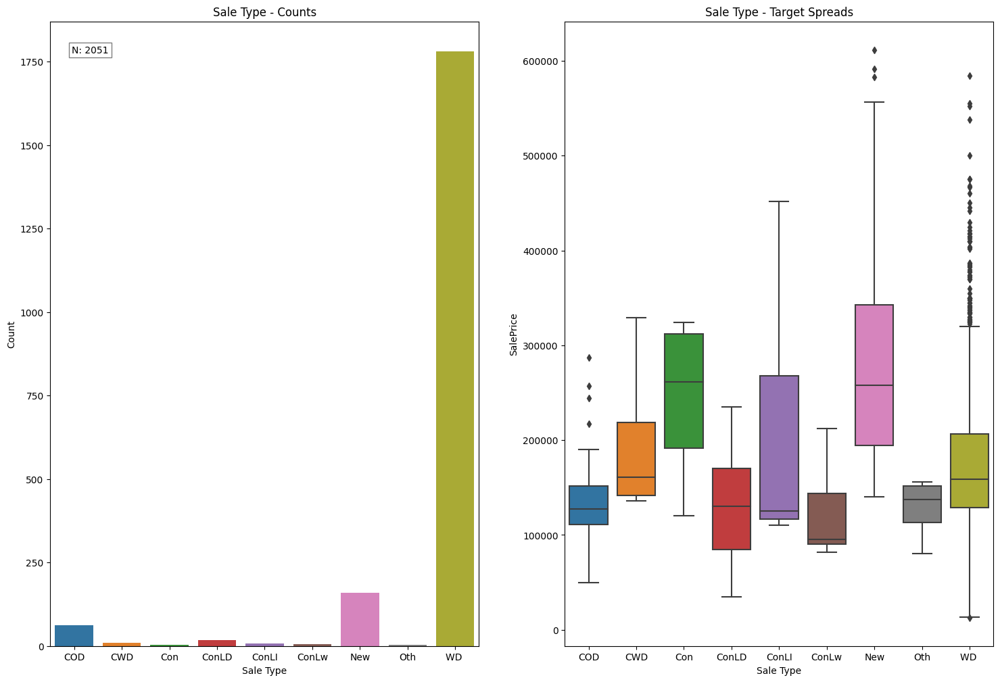

In [14]:
object_data_visualizer(
    objects,
    target_values,
    path="../img/eda",
    show=True,
)

Unlike the numerical features, the categorical features can be summed up succinctly: each feature is either somewhat evenly distributed (Yr and Mo Sold, Garage Finish, Garage Type, Kitchen Qual, Heating QC, BsmtFin Type 1, Bsmt Qual, Foundation, Exter Qual, Mas Vnr Type, Exterior 1st and 2nd, House Style, Neighborhood, Lot Shape, and MS SubClass), or the feature is overwhelmingly dominated by a single category (everything else). Which features to include, and which categories within each feature to include, is not something this analysis will attempt to determine manually. Instead, a systematic approach based on the variance of each column will be implemented post one-hot encoding. The logic for such an approach will be explored below.

# Correlation Analysis

FileNotFoundError: [Errno 2] No such file or directory: '../img/eda/sale_price/numeric_correlation.png'

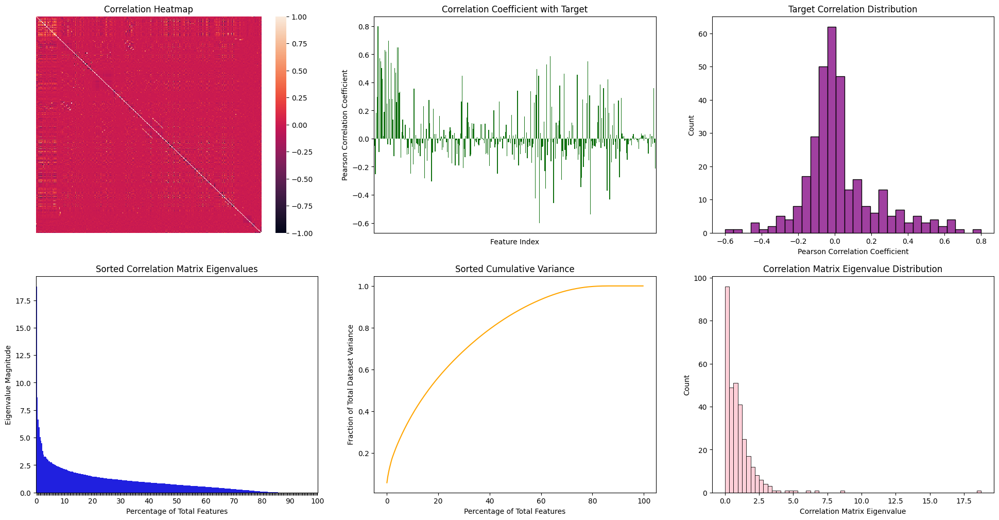

In [15]:
full_data = pd.concat([numerics, pd.get_dummies(objects)], axis=1).fillna(0)

X, y_price = (
    full_data[[col for col in full_data.columns if col != target]].values,
    full_data[target].values,
)
correlation_visualizer(
    X, y_price, path="../img/eda/sale_price", filename="numeric_correlation.png"
)

For the sake of this analysis, null values were filled to be zero in all cases. This is overly simplistic and actually imputation during preprocessing will use more advanced techniques, but it was necessary for plot production. 

First, the heatmap. The bivariate correlations seem to *mostly* be close to zero, which is good. It means we have a strong basis for linear independence among features. There are certainly some outliers in with extreme correlation factors, but these can be systematically filtered out. During preprocessing, if any two features have an absolute value of their correlation above a certain threshold, one will be randomly selected to drop. This will help to reduce colinearity.

The next two plots on the top row are two ways to visualize how strongly each feature correlates with the target. The spread of target correlations is quite large, with the majority of features having little to no linear effect on the sale price of a home. This yields a second way to filter features, which is to define a minimum absolute value of target correlation a feature must meet to be included in the model. Dropping the less correlated features will help to prevent overfitting. 

The bottom three plots take inspiration from PCA, and are not *especially* useful as I will not be applying PCA to the dataset, but they still give some intuition. The plots show the distribution of the eigenvalues of the standardized covariance matrix. If one were applying PCA, the eigenvalues would be interpreted as the amount of variance that the correspond eigenvector has if the covariance matrix were treated as a coordinate transform. Thus, as is shown by the middle plot in the bottom rowm the dataset can be "summed up" by a small number of abstract features, with about 80% of the variance of the dataset being captured by only 40% of the eigenvectors. This could mean that, even without transforming the data with the covariance matrix, it may be wise to simply drop the bottom percentage of features based on something like variance or target covariance.

Now, consider the same plots with the proposed price per unit area target. 

In [ ]:
y_area = full_data["SalePrice"] / full_data["Gr Liv Area"]

correlation_visualizer(
    X, y_area, path="../img/eda", filename="numeric_correlation_price_per_area.png"
)

These distributions are not especially different, but in the correlation coefficient distribution plot there seems to have been two effects: one, extremal values have been "pulled in" closer to the center, while two, the more central values have been slightly pushed out. These effects are not especially significant at a glance, price per area seems to have a greater number of weakly correlated features than sale price.

In [ ]:
y_corr_price = np.array([])
y_corr_area = np.array([])
for feature in range(X.shape[1]):
    y_corr_price = np.append(y_corr_price, np.corrcoef(X[:, feature], y_price)[0, 1])
    y_corr_area = np.append(y_corr_area, np.corrcoef(X[:, feature], y_area)[0, 1])
print(
    f"Mean mangitude of target correlation (Sale Price): {round(np.mean(np.abs(y_corr_price)), 3)}"
)
print(
    f"Mean mangitude of target correlation (Sale Price per Unit Area): {round(np.mean(np.abs(y_corr_area)), 3)}"
)
print(
    f"Mangitude sum of target correlation (Sale Price): {round(np.sum(np.abs(y_corr_price)), 3)}"
)
print(
    f"Mangitude sum of target correlation (Sale Price per Unit Area): {round(np.sum(np.abs(y_corr_area)), 3)}"
)

The effect on switching to price per area seems to be negative, as there is lower average and total correlation with the target. However, this is before any real preprocessing is done, and is thus mostly inconclusive. 

# Preliminary Preprocessing

The above sections detail how to handle each feature in preprocessing, each feature being handled in one of two ways. Either EDA was conclusive on how to handle the feature, or that decision would be determined by model performance. In this section, I will drop and engineer any features as discussed above. One-hot encoding, imputing, and variance-based feature selection will happen in the model selection pipeline, as there are multiple ways to do all of these (except one-hot encoding, which is being left to the pipeline to safely handle potential missing categories between the train and test datasets). 

In [ ]:
def preprocess(df, train_set=True):
    # create shifted id
    df["yearly_min_id"] = df.groupby(by="Yr Sold")["Id"].transform(min)
    df["shifted_id"] = df["Id"] - df["yearly_min_id"]
    df = df.drop(columns=["yearly_min_id"])

    # create timestamp
    # timestamp should be considered as an alternative to
    # day month columns
    df["year_month"] = df["Yr Sold"] + "-" + df["Mo Sold"]
    df["sale_timestamp"] = pd.to_datetime(df["year_month"]).view(int)

    # create pid dummy columns for potential data splitting
    df = df.join(pd.get_dummies(df["PID"].apply(lambda x: str(x)[0]), prefix="pid"))
    df = df.drop(columns=["PID"])

    # drop masonry area
    df = df.drop(columns=["Mas Vnr Area"])

    # drop basement finished areas
    df["basement_finished_area"] = df["BsmtFin SF 1"] + df["BsmtFin SF 2"]
    df = df.drop(columns=["BsmtFin SF 1", "BsmtFin SF 2", "Total Bsmt SF"])

    # construct total bathroom columns
    df["half_baths"] = df["Half Bath"] + df["Bsmt Half Bath"]
    df["full_baths"] = df["Full Bath"] + df["Bsmt Full Bath"]
    df = df.drop(columns=["Bsmt Full Bath", "Bsmt Half Bath", "Full Bath", "Half Bath"])

    # restructure and drop TotRms AbvGrd
    df["other_rooms_above_grade"] = (
        df["TotRms AbvGrd"] - df["Kitchen AbvGr"] - df["Bedroom AbvGr"]
    )
    df = df.drop(columns=["TotRms AbvGrd"])

    # create exterior developed area
    df["exterior_developed_area"] = (
        df["Wood Deck SF"]
        + df["Open Porch SF"]
        + df["Enclosed Porch"]
        + df["3Ssn Porch"]
        + df["Screen Porch"]
        + df["Pool Area"]
    )
    df = df.drop(
        columns=[
            "Wood Deck SF",
            "Open Porch SF",
            "Enclosed Porch",
            "3Ssn Porch",
            "Screen Porch",
            "Pool Area",
        ]
    )

    df = df.drop(columns=["Misc Val"])

    if train_set:
        # create target variants
        df["price_per_area"] = df["SalePrice"] / df["Gr Liv Area"]

    # rename all columns to snake case
    df = df.rename(columns={col: col.replace(" ", "_").lower() for col in df.columns})

    return df


ames_test = pd.read_csv(
    "../datasets/test.csv",
    dtype={"MS SubClass": object, "Yr Sold": object, "Mo Sold": object},
)

ames_train = preprocess(ames_train)
ames_test = preprocess(ames_test, train_set=False)

The files are now formatted and ready for the preprocessing and modeling process. Now, to view some interesting statistics about the train and test data sets to ensure things are consistent between the train and test datsets. Because the preprocessing pipeline will be designed to handle missing values, we'll only view numeric statistics.

In [ ]:
interesting_stats = [
    "count",
    "null_count",
    "mean",
    "median",
    "minimum",
    "maximum",
    "unique_count",
    "5%",
    "95%",
    "standard_error",
    "skew",
    "autocorrelation_time",
]

train_statistics = descriptive_statistics(ames_train)[
    interesting_stats
].dropna()  # object types return nan for most columns
test_statistics = descriptive_statistics(ames_test)[interesting_stats].dropna()

In [ ]:
train_statistics.head(50)

We note here that positive skew values are very common in the dataset. A power transform (Box-Cox or Yeo-Johnson) will be implemented as part of preprocessing, so it is not of too much concern, but as the transformation is automatic, our model loses interpretability. Standard errors are small compared to the mean and all values have an autocorrelation time of $\tau=1$, so this model is likely well sampled compared to the full population. Next, we analyze the differences in these stats compared to the test model.

In [ ]:
(train_statistics - test_statistics).head(50)

First thing to note is that there is a new class of pid in the test (which is why most one-hot encoding will be handled by sklearn), but it only corresponds to one entry, so it shouldn't effect the fit too much in the case of splitting. The two target values are missing, of course, but for the most part things look good. Most stats are very comparable between the two datasets. The only thing that is especially concerning is lot area, which has both of the extremal values in the test set outside of the domain of the test set. With this, we save our datasets and move onto the model selection process.

In [ ]:
# save to file
ames_train.to_csv("../datasets/train_preprocessed.csv", index=False)
ames_test.drop(columns=["pid_1"]).to_csv(
    "../datasets/test_preprocessed.csv", index=False
)